# Tarea de Deep Learning
## Uso de un modelo preentrenado para su afinado en un dataset de clasificación de imágenes.
En este caso se proporcionará a los alumnos un dataset pequeño de imágenes con tres
categorías de osos: 'grizzly', 'teddy' y 'black'. Dicho dataset estará en el repositorio de
código, en la ruta datasets/practica/osos.tar Los alumnos emplearán una red
preentrenada que afinarán con este dataset, de manera similar a la vista en clase para
otros dataset.

In [59]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
#conservaremos los mensajes de error

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

tf.keras.backend.clear_session()  # For easy reset of notebook state.

from tensorflow.keras.preprocessing import image

#Según la documentación que reviso cuando se trabaja con GPUs internamente puede tener semillas diferentes
#lo que dificulta la reproducibilidad. Aún así establezco semillas para otros procesos

from numpy.random import seed
seed(123)
from tensorflow import random
random.set_seed(456)



In [60]:
base_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/practicas/'

Contamos con 80 imágenes de cada tipo de oso

In [61]:
print(base_path)

C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/practicas/


In [62]:
import tensorflow as tf
tf.__version__ 

'2.3.0'

Con esta versión de TF tuvimos que actualizar algunas sentencias

In [63]:
# tf version session setting lines
from tensorflow.python.keras.backend import set_session
from tensorflow.python.keras.models import load_model
#import tensorflow as tf

from tensorflow.compat.v1 import ConfigProto
config = ConfigProto()
config.gpu_options.allow_growth = True

#sess = tf.Session(config=config)
sess = tf.compat.v1.Session(config=config)
graph = tf.compat.v1.get_default_graph()

# IMPORTANT: models have to be loaded AFTER SETTING THE SESSION for keras! 
# Otherwise, their weights will be unavailable in the threads after the session there has been set
set_session(sess)

## Modelo preentrenado VGG16

In [64]:
import pandas as pd
import numpy as np
# import os
import keras

from tensorflow.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow.keras.applications.vgg16 import VGG16

# imports the vgg16 model and discards the last layer.
base_model = VGG16(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
preds = Dense(3, activation='softmax')(x) #3 tipos de osos

In [65]:
from tensorflow.keras.models import Model
model = Model(inputs=base_model.input, outputs=preds)

In [66]:
len (base_model.layers)

19

In [67]:
len (model.layers)-len (base_model.layers)-1

2

Hemos añadido un global average pooling más una capa densa

In [68]:
for layer in model.layers[:19]:
    layer.trainable=False
for layer in model.layers[19:]:
    layer.trainable=True
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)  

Entrenaremos para 264,195 parámetros: 262656+1539 

In [69]:
#!pip install split-folders

#import splitfolders  # or import split_folders
#splitfolders.ratio("C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/practicas/osos/", output="C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/practicas/output", seed=1337, ratio=(.7, .3), group_prefix=None) # default values

Creamos una carpeta para entranamienta y una para validacion. La data para realizar testing la bajamos de internet (18 imágenes)

In [70]:
data_entrenamiento = base_path + 'output/train/'
data_validacion = base_path + 'output/val/'
data_test = base_path + 'output/test_internet/'

In [71]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input as preprocess_vgg16

train_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16) 

color_mode='rgb'
batch_size=8
class_mode='categorical'
shuffle=True

train_generator=train_datagen.flow_from_directory(data_entrenamiento, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)


val_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16) 

val_generator=val_datagen.flow_from_directory(data_validacion, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)

print(train_generator.class_indices)
print(val_generator.class_indices)

Found 168 images belonging to 3 classes.
Found 72 images belonging to 3 classes.
{'black': 0, 'grizzly': 1, 'teddys': 2}
{'black': 0, 'grizzly': 1, 'teddys': 2}


In [75]:
from keras.optimizers import Adam
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size


H=model.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )


Epoch 1/16
84/84 [==============================] - 3s 39ms/step - loss: 0.0844 - accuracy: 0.9940 - val_loss: 2.0004 - val_accuracy: 0.9167
Epoch 2/16
84/84 [==============================] - 3s 37ms/step - loss: 0.2166 - accuracy: 0.9821 - val_loss: 0.6945 - val_accuracy: 0.9306
Epoch 3/16
84/84 [==============================] - 3s 39ms/step - loss: 0.0897 - accuracy: 0.9821 - val_loss: 2.0519 - val_accuracy: 0.8750
Epoch 4/16
84/84 [==============================] - 3s 37ms/step - loss: 0.3235 - accuracy: 0.9821 - val_loss: 3.3347 - val_accuracy: 0.9583
Epoch 5/16
84/84 [==============================] - 3s 37ms/step - loss: 1.2353 - accuracy: 0.9583 - val_loss: 2.4022 - val_accuracy: 0.8472
Epoch 6/16
84/84 [==============================] - 3s 37ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.0439 - val_accuracy: 0.9444
Epoch 7/16
84/84 [==============================] - 3s 37ms/step - loss: 1.7030e-08 - accuracy: 1.0000 - val_loss: 1.0430 - val_accuracy: 0.9444
Epoch 8/1

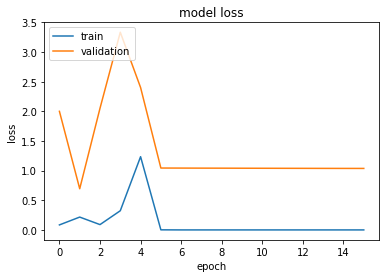

In [76]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H.history['loss'])
plt.plot(H.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

El loss del entrenamiento y de validación presentan comportamiento similar aunque no estén muy juntas. La data de validación se estabiliza alrededor de 1.03 , llegando a ser 1.0374 en su última época.

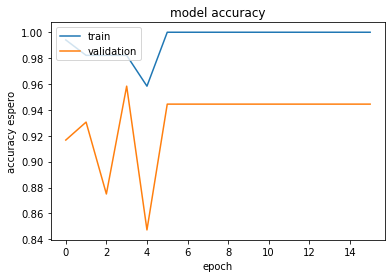

In [77]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H.history['accuracy'])
plt.plot(H.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Igualmente para el accuracy la data de entrenamiento y la de validación tienen comportamientos similares. La data de validación se estabiliza en 0.9444 en sus última épocas. Se observa overfitting en la data de entrenamiento en la época 6 ya que llega a tener accuracy de 1.

In [199]:
max_val_acc = max(H.history['val_accuracy'])
mean_val_acc = np.mean(H.history['val_accuracy'])
print(max_val_acc)
print(mean_val_acc)

0.9583333134651184
0.9322916492819786


Observamos una máxima de 0.958 en el accuracy en la época 4 pero en promedio se obtuvo 0.93 en las 16 épocas. Estas métricas las tendremos en cuenta al comparar los modelos.

In [78]:
from numpy import expand_dims
import matplotlib.pyplot as plt

class_dict = {v:k for k, v in train_generator.class_indices.items()}

def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_vgg16(data)
    preds = model.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')

black


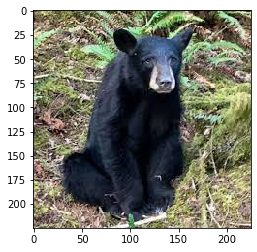

grizzly


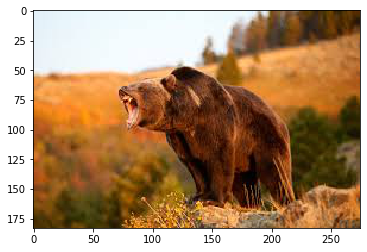

grizzly


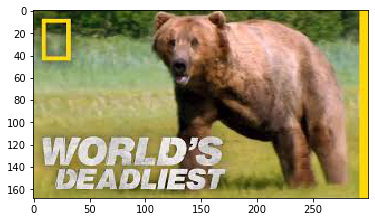

teddys


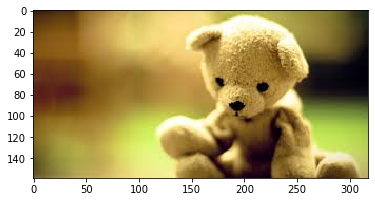

teddys


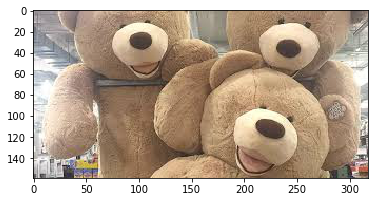

teddys


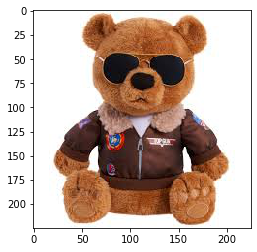

teddys


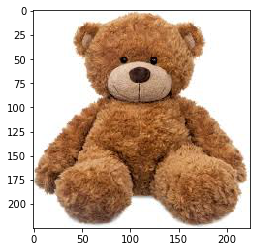

teddys


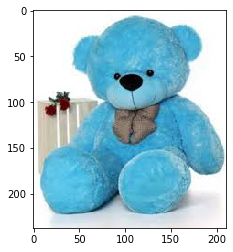

teddys


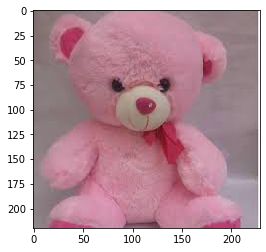

grizzly


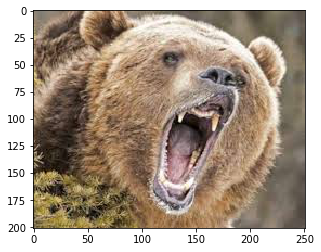

teddys


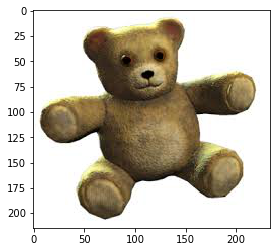

black


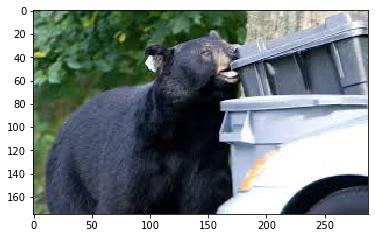

grizzly


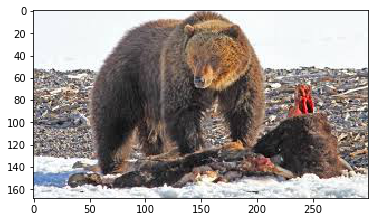

black


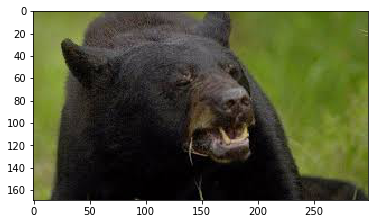

grizzly


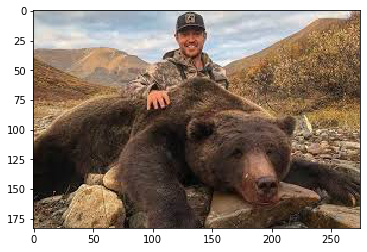

black


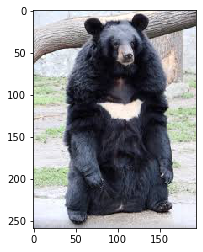

grizzly


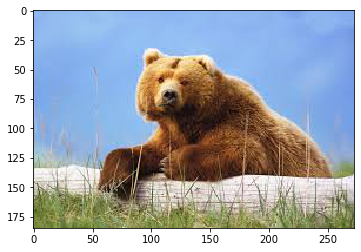

black


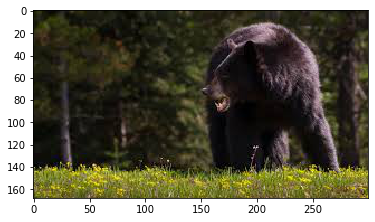

In [79]:
path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

La data para testing se obtuvo de internet y de los 18 elementos acertó todos. Se requiere más casos para estar seguros.

In [80]:
model.save('C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/practicas/models/modelo_vgg16_1.h5')

## A continuación cambiaremos la arquitectura de la red con el fin de mejorar resultados en la data de validación reduciendo overfitting

In [81]:
from tensorflow.keras.layers import Dropout

base_model = VGG16(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(216, activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.1))(x) #capa densa con 216 unidades
x = Dropout(0.3)(x)
preds = Dense(3, activation='softmax')(x) #3 tipos de osos

Redujimos el número de neuronas, realizamos algunas desconexiones y una regularización con el fin de reducir el overfitting inicial

In [82]:
model2 = Model(inputs=base_model.input, outputs=preds)


In [83]:
len (model2.layers)-len (base_model.layers)-1

3

No hemos agregado capas, sólo el dropout

In [84]:
for layer in model2.layers[:19]:
    layer.trainable=False
for layer in model2.layers[19:]:
    layer.trainable=True
model2.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)  

Menor número de parámetros por la disminución de neuronas

In [85]:
model2.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H2=model2.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )


Epoch 1/16
84/84 [==============================] - 3s 40ms/step - loss: 21.8878 - accuracy: 0.8274 - val_loss: 14.6976 - val_accuracy: 0.9167
Epoch 2/16
84/84 [==============================] - 3s 37ms/step - loss: 11.9992 - accuracy: 0.9345 - val_loss: 9.8715 - val_accuracy: 0.8750
Epoch 3/16
84/84 [==============================] - 3s 37ms/step - loss: 8.2835 - accuracy: 0.9048 - val_loss: 7.2575 - val_accuracy: 0.9444
Epoch 4/16
84/84 [==============================] - 3s 37ms/step - loss: 5.7564 - accuracy: 0.9881 - val_loss: 5.2850 - val_accuracy: 0.9167
Epoch 5/16
84/84 [==============================] - 3s 37ms/step - loss: 4.1409 - accuracy: 0.9940 - val_loss: 4.0432 - val_accuracy: 0.9167
Epoch 6/16
84/84 [==============================] - 3s 37ms/step - loss: 3.3019 - accuracy: 0.9643 - val_loss: 3.7290 - val_accuracy: 0.9167
Epoch 7/16
84/84 [==============================] - 3s 37ms/step - loss: 2.7154 - accuracy: 0.9702 - val_loss: 2.8059 - val_accuracy: 0.9306
Epoch 8/16

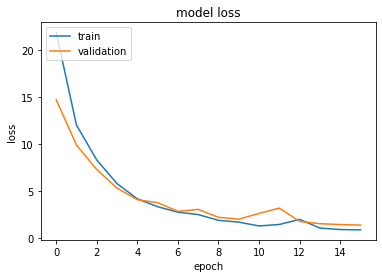

In [86]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H2.history['loss'])
plt.plot(H2.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Buen comportamiento de data train y val, ya que se comportan muy parecido y se juntan, alcanzan el valor de loss de 1.3419, quizá con más épocas disminuía más.

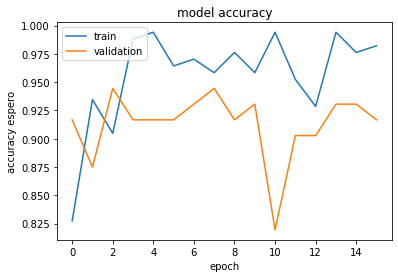

In [87]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H2.history['accuracy'])
plt.plot(H2.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Comportamiento errático del accuracy, quizá por el dropout que hace que en algunas épocas se caida. Al final alcanzó 0.9167.

black


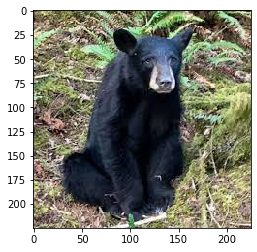

grizzly


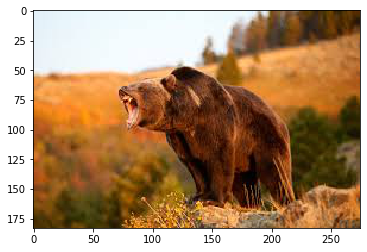

grizzly


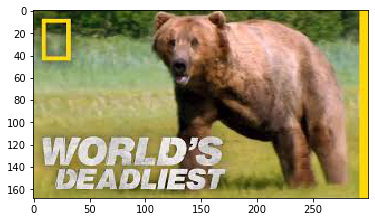

grizzly


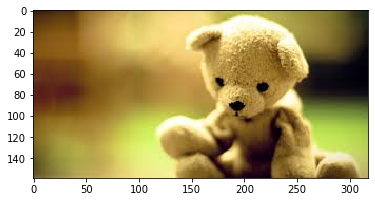

teddys


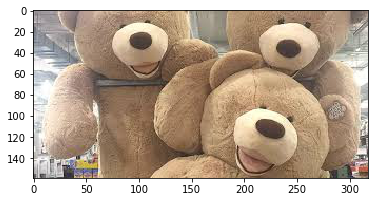

teddys


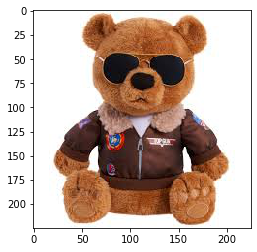

teddys


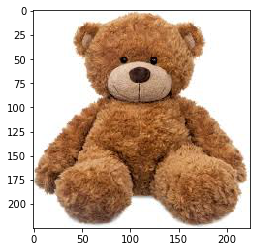

teddys


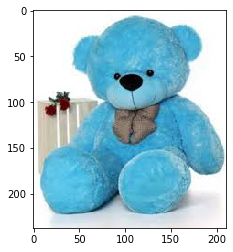

teddys


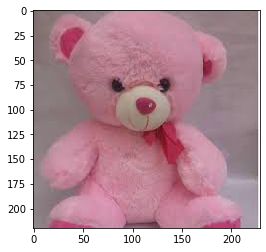

grizzly


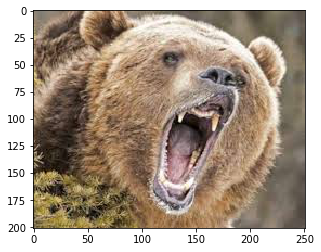

teddys


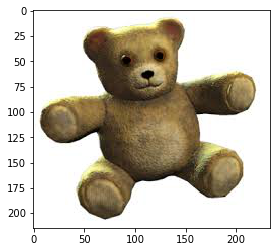

black


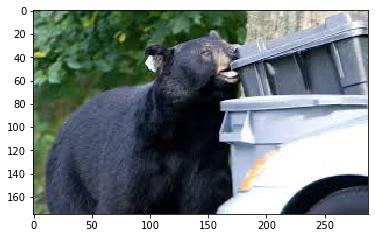

grizzly


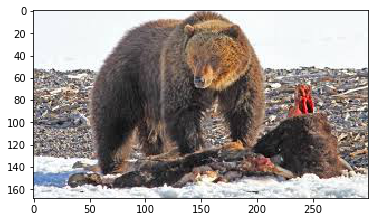

black


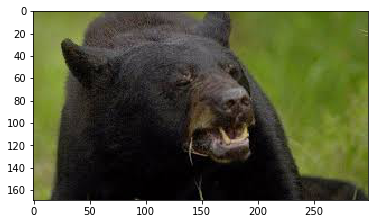

grizzly


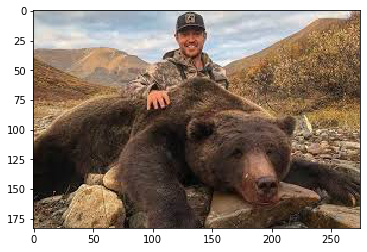

black


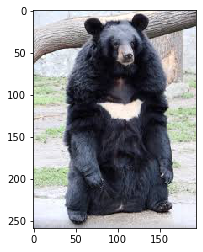

grizzly


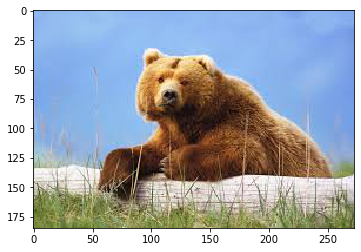

grizzly


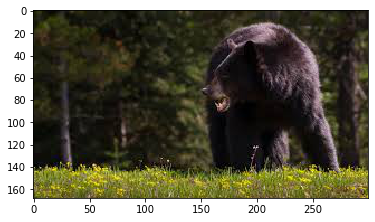

In [88]:
def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_vgg16(data)
    preds = model2.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')


path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

De las 18 imágenes tuvo un error en 2, clasificó un osos teddy como glizzly y un oso negro como grizzly también. 

## Probemos haciendo una red más compleja regresando a 512 neuronas,  pero controlemos el overfitting

In [89]:
from tensorflow.keras.layers import Dropout

base_model = VGG16(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.1))(x) #capa densa con 1024 unidades
x = Dropout(0.3)(x)
preds = Dense(3, activation='softmax')(x) #3 tipos de osos

In [90]:
model3 = Model(inputs=base_model.input, outputs=preds)

In [91]:
len (model3.layers)-len (base_model.layers)-1

3

In [92]:
for layer in model3.layers[:19]:
    layer.trainable=False
for layer in model3.layers[19:]:
    layer.trainable=True
model3.summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)  

In [93]:
model3.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H3=model3.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )


Epoch 1/16
84/84 [==============================] - 3s 39ms/step - loss: 33.9968 - accuracy: 0.8155 - val_loss: 21.5633 - val_accuracy: 0.9306
Epoch 2/16
84/84 [==============================] - 3s 37ms/step - loss: 16.9002 - accuracy: 0.9226 - val_loss: 13.3704 - val_accuracy: 0.9444
Epoch 3/16
84/84 [==============================] - 3s 37ms/step - loss: 10.2690 - accuracy: 0.9881 - val_loss: 8.7743 - val_accuracy: 0.9444
Epoch 4/16
84/84 [==============================] - 3s 37ms/step - loss: 6.7795 - accuracy: 0.9702 - val_loss: 6.5076 - val_accuracy: 0.9444
Epoch 5/16
84/84 [==============================] - 3s 37ms/step - loss: 5.3285 - accuracy: 0.9524 - val_loss: 5.1900 - val_accuracy: 0.9028
Epoch 6/16
84/84 [==============================] - 3s 37ms/step - loss: 4.7833 - accuracy: 0.9405 - val_loss: 4.3893 - val_accuracy: 0.9444
Epoch 7/16
84/84 [==============================] - 3s 37ms/step - loss: 3.4202 - accuracy: 0.9702 - val_loss: 3.1105 - val_accuracy: 0.9444
Epoch 8/

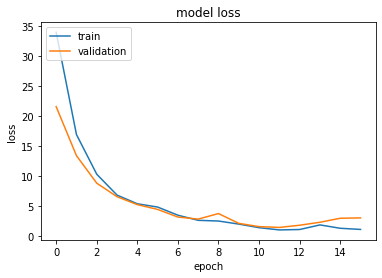

In [94]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H3.history['loss'])
plt.plot(H3.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')


Se tiene un comportamiento similar que antes pero con loss más alto.

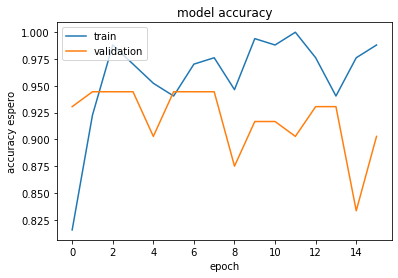

In [95]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H3.history['accuracy'])
plt.plot(H3.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

En la data de validación se aprecia una disminución gradual del accuracy, quedando en 0.9028

black


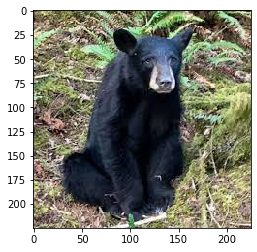

grizzly


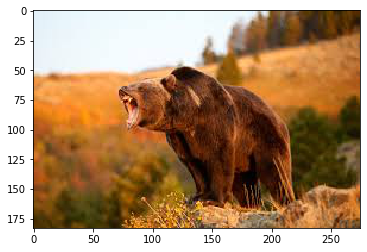

black


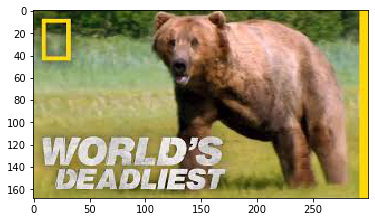

teddys


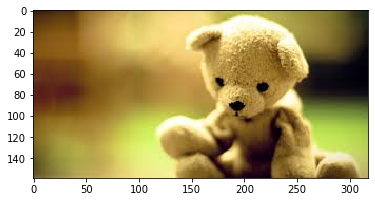

teddys


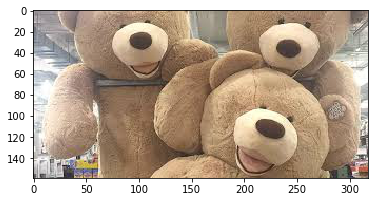

teddys


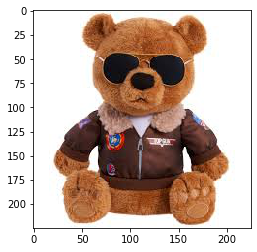

teddys


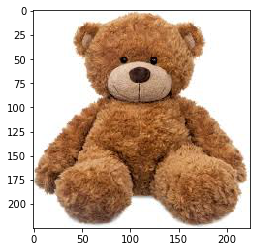

teddys


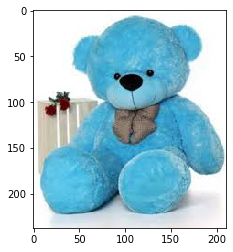

teddys


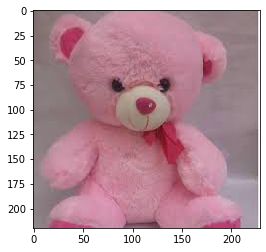

grizzly


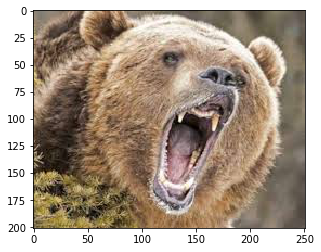

teddys


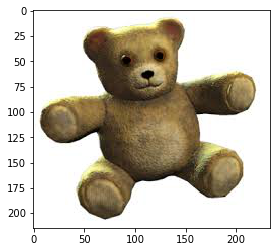

black


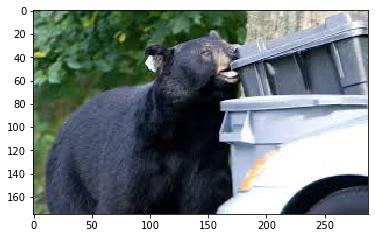

black


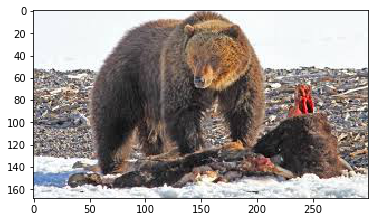

black


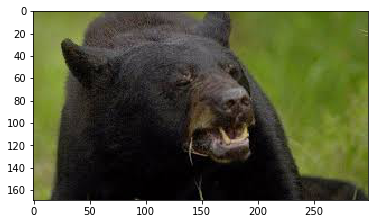

black


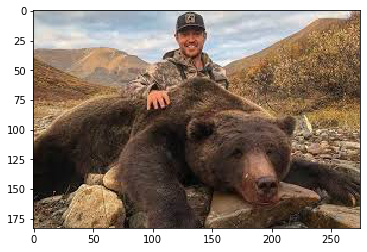

black


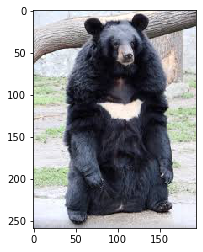

grizzly


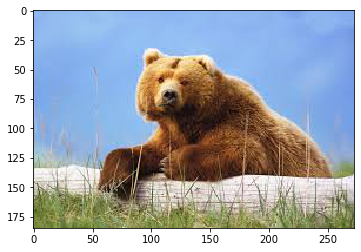

black


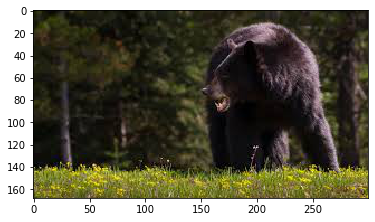

In [96]:
def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_vgg16(data)
    preds = model3.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')


path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

Se obtuvo 3 errores.

# Ahora agregaremos una capa adicional a la que ya estábamos agregando

In [97]:

# imports the vgg16 model and discards the last layer.
base_model = VGG16(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
x = Dense(512, activation='relu')(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
preds = Dense(3, activation='softmax')(x) #3 tipos de osos



In [98]:

model4 = Model(inputs=base_model.input, outputs=preds)

In [99]:
len (model4.layers)-len (base_model.layers)-1


3

Una capa más

In [100]:

for layer in model4.layers[:19]:
    layer.trainable=False
for layer in model4.layers[19:]:
    layer.trainable=True
model4.summary()

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)  

Más parámetros

In [101]:
model4.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H4=model4.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/16
84/84 [==============================] - 3s 40ms/step - loss: 1.6665 - accuracy: 0.8512 - val_loss: 1.4003 - val_accuracy: 0.8750
Epoch 2/16
84/84 [==============================] - 3s 37ms/step - loss: 0.3055 - accuracy: 0.9762 - val_loss: 0.5946 - val_accuracy: 0.9444
Epoch 3/16
84/84 [==============================] - 3s 37ms/step - loss: 0.1485 - accuracy: 0.9762 - val_loss: 0.1986 - val_accuracy: 0.9306
Epoch 4/16
84/84 [==============================] - 3s 37ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.2037 - val_accuracy: 0.9028
Epoch 5/16
84/84 [==============================] - 3s 38ms/step - loss: 1.4294e-04 - accuracy: 1.0000 - val_loss: 0.2189 - val_accuracy: 0.9028
Epoch 6/16
84/84 [==============================] - 3s 37ms/step - loss: 7.3437e-05 - accuracy: 1.0000 - val_loss: 0.2230 - val_accuracy: 0.9028
Epoch 7/16
84/84 [==============================] - 3s 37ms/step - loss: 6.0237e-05 - accuracy: 1.0000 - val_loss: 0.2249 - val_accuracy: 0.9028
E

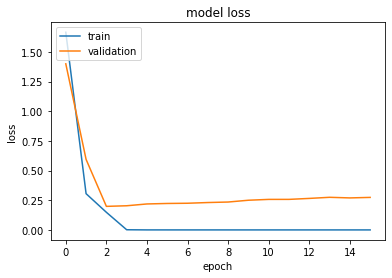

In [102]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H4.history['loss'])
plt.plot(H4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Se obtuvo un loss más bajo que con los otros modelos terminando en 0.2741 para la data de validación. En cuanto a la data de train estamos cerca al 0, quizá haya overfitting allí.

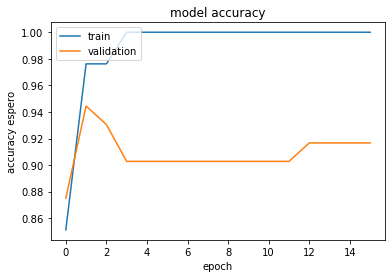

In [104]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H4.history['accuracy'])
plt.plot(H4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

En cuanto a accuracy se alcanzó el valor de 0.9167 en la validación y se vee que alcanzó rápido el overfitting  en data train

black


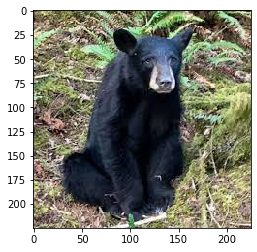

grizzly


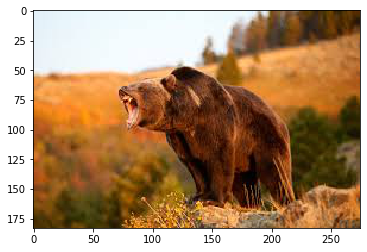

grizzly


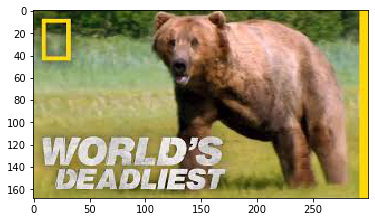

grizzly


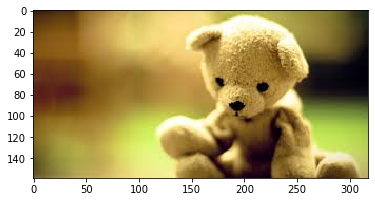

teddys


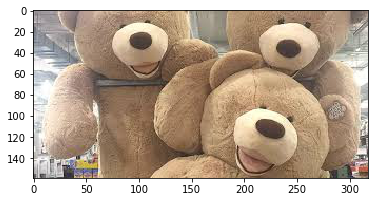

teddys


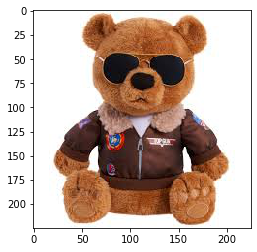

teddys


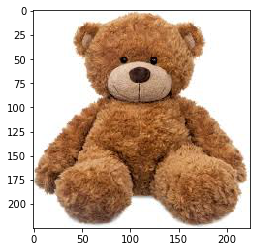

teddys


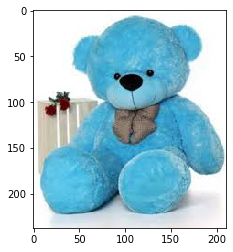

teddys


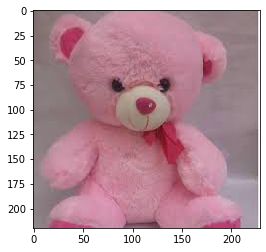

grizzly


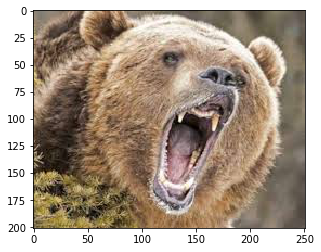

teddys


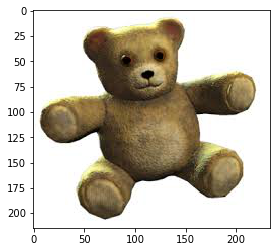

black


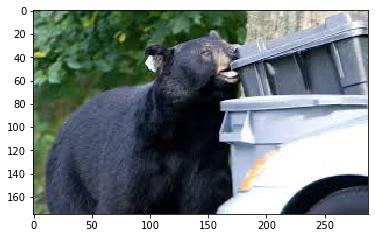

grizzly


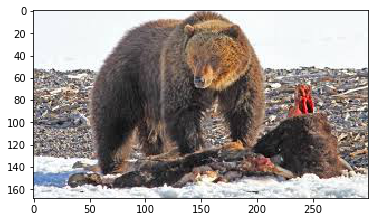

black


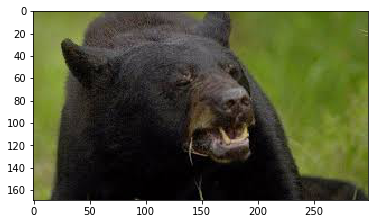

grizzly


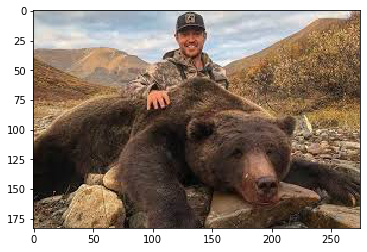

black


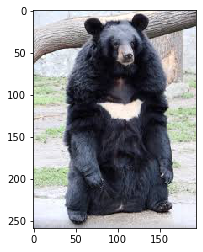

grizzly


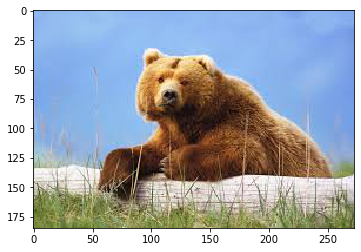

black


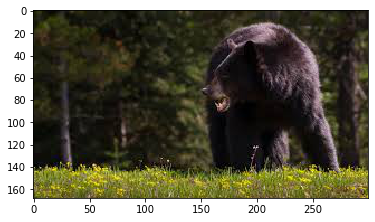

In [105]:

class_dict = {v:k for k, v in train_generator.class_indices.items()}

def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_vgg16(data)
    preds = model4.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')


path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

Se obtuvo 1 error en un osso teddy que parece grizzly.

# Ahora probaremos conservando la capa adicional pero regularizando más

In [106]:
base_model = VGG16(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu',kernel_regularizer=tf.keras.regularizers.L1(0.01),activity_regularizer=tf.keras.regularizers.L2(0.01))(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
x = Dense(512, activation='relu',kernel_regularizer=tf.keras.regularizers.L1(0.01),activity_regularizer=tf.keras.regularizers.L2(0.01))(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
Dropout(0.3)(x)
preds = Dense(3, activation='softmax')(x) #3 tipos de osos


In [107]:
model5 = Model(inputs=base_model.input, outputs=preds)

In [108]:
len (model5.layers)-len (base_model.layers)-1

3

In [109]:
for layer in model5.layers[:19]:
    layer.trainable=False
for layer in model5.layers[19:]:
    layer.trainable=True
model5.summary()

Model: "functional_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)  

In [111]:

model5.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H5=model5.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )



Epoch 1/16
84/84 [==============================] - 3s 41ms/step - loss: 1.7157 - accuracy: 0.9405 - val_loss: 1.1780 - val_accuracy: 0.9167
Epoch 2/16
84/84 [==============================] - 3s 37ms/step - loss: 1.0105 - accuracy: 0.9881 - val_loss: 1.4515 - val_accuracy: 0.8333
Epoch 3/16
84/84 [==============================] - 3s 38ms/step - loss: 1.0401 - accuracy: 0.9762 - val_loss: 1.3746 - val_accuracy: 0.8333
Epoch 4/16
84/84 [==============================] - 3s 38ms/step - loss: 1.2437 - accuracy: 0.8869 - val_loss: 1.6145 - val_accuracy: 0.6667
Epoch 5/16
84/84 [==============================] - 3s 38ms/step - loss: 1.1633 - accuracy: 0.9226 - val_loss: 1.1691 - val_accuracy: 0.9028
Epoch 6/16
84/84 [==============================] - 3s 38ms/step - loss: 1.0004 - accuracy: 0.9821 - val_loss: 1.2006 - val_accuracy: 0.8889
Epoch 7/16
84/84 [==============================] - 3s 38ms/step - loss: 0.9219 - accuracy: 0.9881 - val_loss: 1.1834 - val_accuracy: 0.8750
Epoch 8/16
84

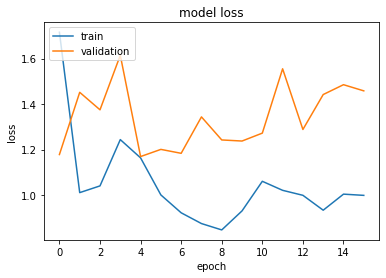

In [112]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H5.history['loss'])
plt.plot(H5.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')



No está clara la disminución gradual del loss, quizá por las regularizaciones que van afectando cada época. Se terminó en 1.4580

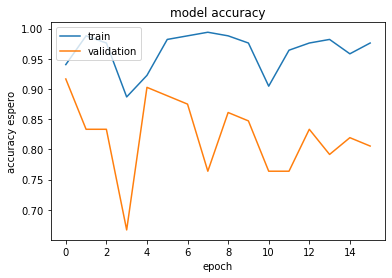

In [114]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H5.history['accuracy'])
plt.plot(H5.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Muy parecido el comportamiento para el accuracy en cuanto a lo irregular de resultados se terminó en 0.8056 en la data de validación.

black


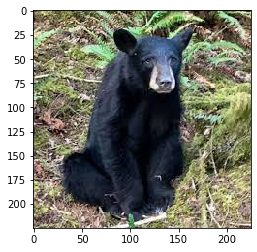

grizzly


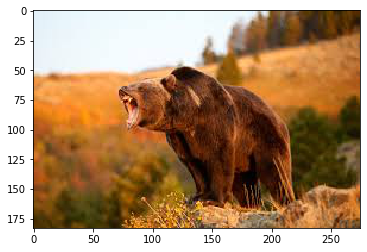

grizzly


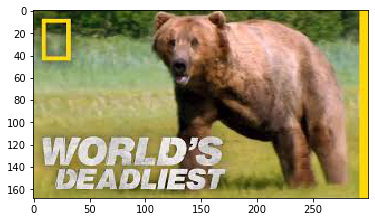

grizzly


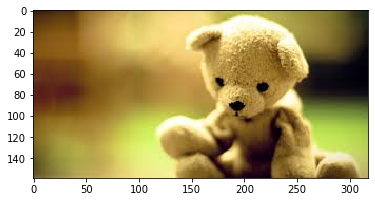

teddys


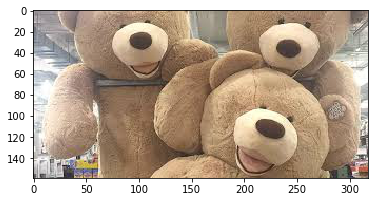

teddys


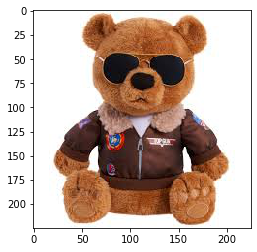

teddys


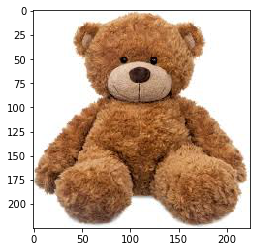

teddys


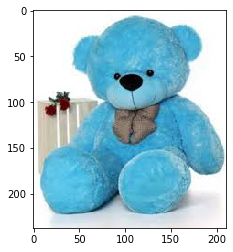

teddys


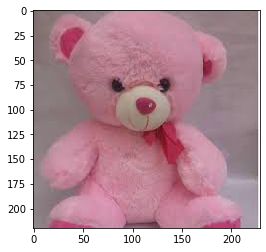

grizzly


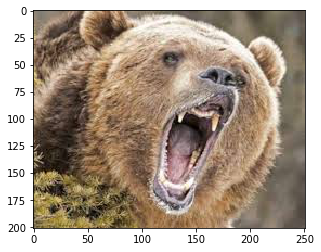

teddys


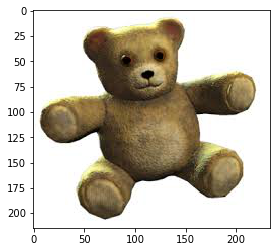

black


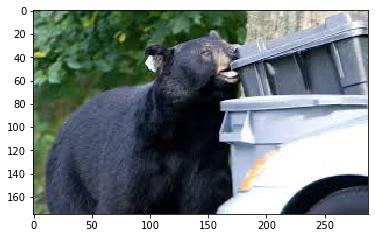

grizzly


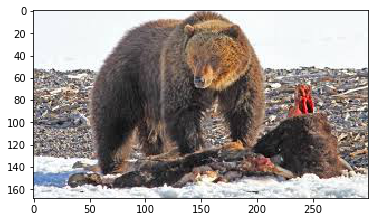

grizzly


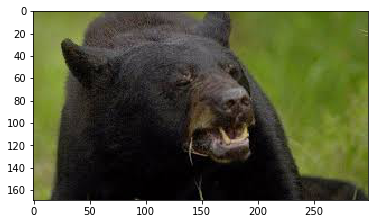

grizzly


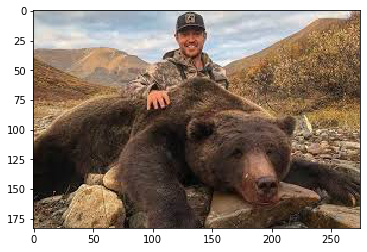

black


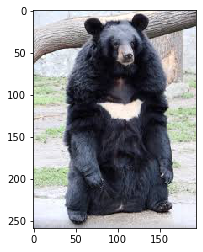

grizzly


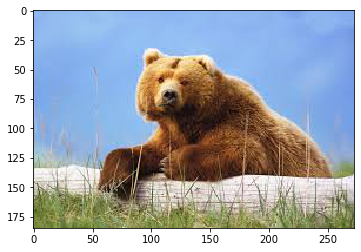

grizzly


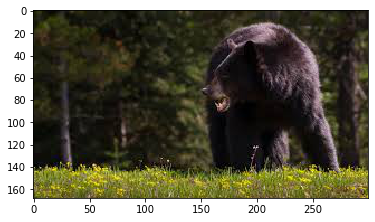

In [115]:

class_dict = {v:k for k, v in train_generator.class_indices.items()}

def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_vgg16(data)
    preds = model5.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')



path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

Tuvo 3 errores

# A continuación probaremos utilizando otro modelo preentrenado MobileNet 

In [116]:
#from tensorflow.keras.applications.MobileNet import MobileNet

from tensorflow.keras.applications import MobileNet 
# imports the MobileNet model and discards the last layer.
base_model = MobileNet(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
preds = Dense(3, activation='softmax')(x) #3 tipos de osos

In [117]:
model6 = Model(inputs=base_model.input, outputs=preds)

In [118]:
len (base_model.layers)

87

In [119]:
len (model6.layers)-len (base_model.layers)-1

2

Tiene muchas más capas, sólo agregaremos el pooling y una capa densa. También hemos cambiado la salida a multiclase de 3.

In [120]:
for layer in model6.layers[:87]:
    layer.trainable=False
for layer in model6.layers[87:]:
    layer.trainable=True
model6.summary()

Model: "functional_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, None, None, 3)     0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)  

In [121]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.mobilenet import preprocess_input as preprocess_mobilenet

train_datagen = ImageDataGenerator(preprocessing_function=preprocess_mobilenet) 

color_mode='rgb'
batch_size=8
class_mode='categorical'
shuffle=True

train_generator=train_datagen.flow_from_directory(data_entrenamiento, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)


val_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16) 

val_generator=val_datagen.flow_from_directory(data_validacion, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)

print(train_generator.class_indices)
print(val_generator.class_indices)

Found 168 images belonging to 3 classes.
Found 72 images belonging to 3 classes.
{'black': 0, 'grizzly': 1, 'teddys': 2}
{'black': 0, 'grizzly': 1, 'teddys': 2}


In [122]:
model6.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H6=model6.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/16
84/84 [==============================] - 1s 15ms/step - loss: 0.7307 - accuracy: 0.8333 - val_loss: 1.6103 - val_accuracy: 0.5000
Epoch 2/16
84/84 [==============================] - 1s 10ms/step - loss: 0.0516 - accuracy: 0.9762 - val_loss: 1.8910 - val_accuracy: 0.4583
Epoch 3/16
84/84 [==============================] - 1s 10ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 2.1339 - val_accuracy: 0.3889
Epoch 4/16
84/84 [==============================] - 1s 10ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 2.2183 - val_accuracy: 0.4167
Epoch 5/16
84/84 [==============================] - 1s 10ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.1613 - val_accuracy: 0.4028
Epoch 6/16
84/84 [==============================] - 1s 10ms/step - loss: 7.8859e-04 - accuracy: 1.0000 - val_loss: 2.1868 - val_accuracy: 0.4028
Epoch 7/16
84/84 [==============================] - 1s 9ms/step - loss: 6.3133e-04 - accuracy: 1.0000 - val_loss: 2.1965 - val_accuracy: 0.4028
Epoch 

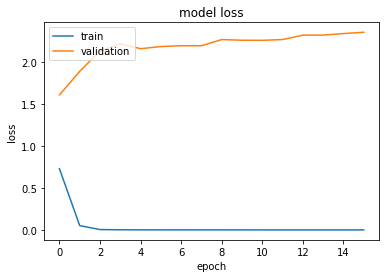

In [123]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H6.history['loss'])
plt.plot(H6.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Alto nivel de loss para la validación, llegó a ser 2.3574 y siempre lejos de la curva de entrenamiento.

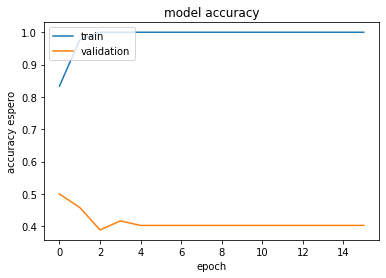

In [124]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H6.history['accuracy'])
plt.plot(H6.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Muy bajo accuracy 0.4028

black


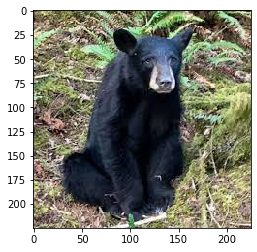

grizzly


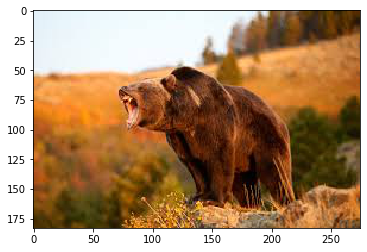

grizzly


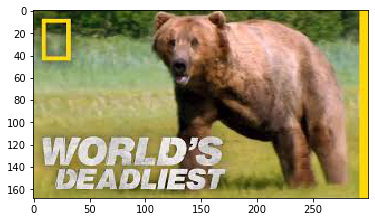

teddys


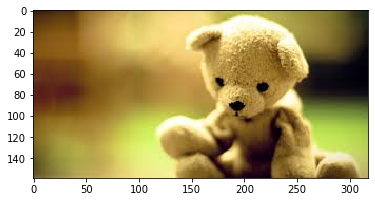

teddys


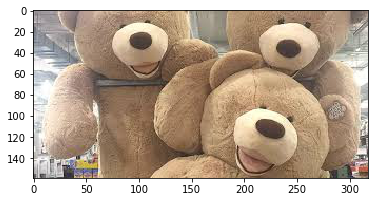

teddys


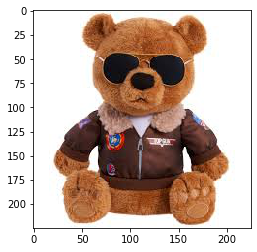

teddys


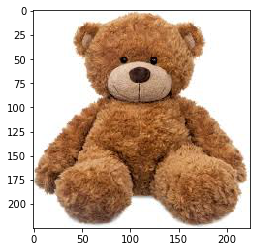

teddys


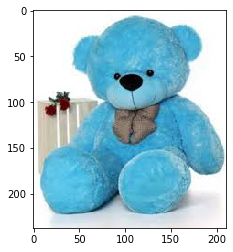

teddys


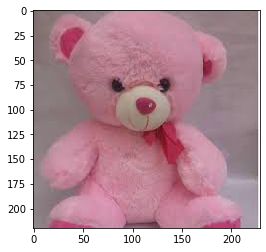

grizzly


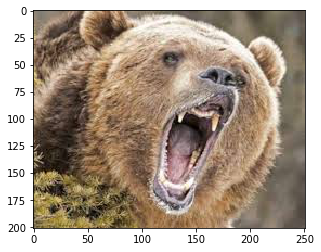

teddys


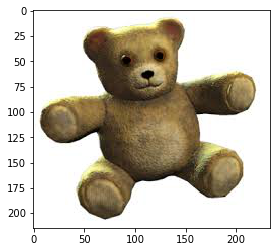

black


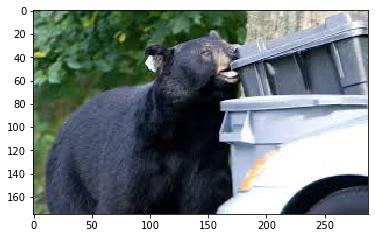

grizzly


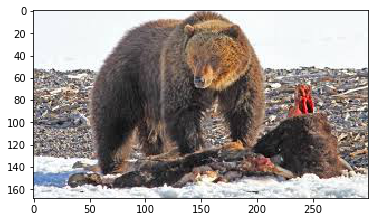

black


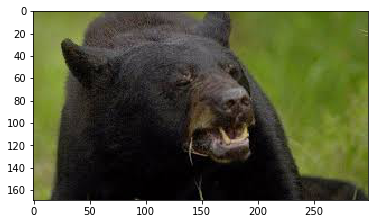

grizzly


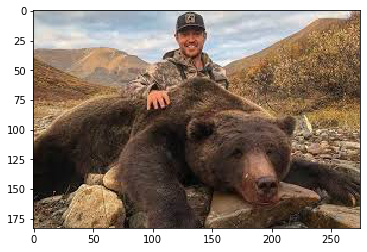

black


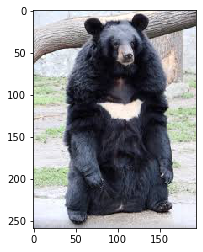

grizzly


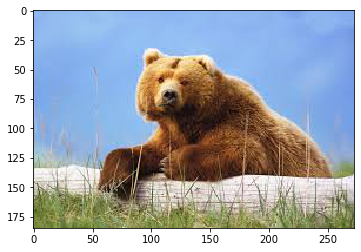

black


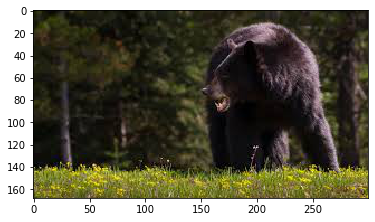

In [125]:
class_dict = {v:k for k, v in train_generator.class_indices.items()}

def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_mobilenet(data)
    preds = model6.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')


path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

No hubo errores en la data test auque las métricas no fueran buenas

# A continuación probaremos agregando una capa más más al Mobilnet

In [127]:
base_model = MobileNet(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
x = Dense(512, activation='relu')(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
preds = Dense(3, activation='softmax')(x) #3 tipos de osos

In [128]:
model7 = Model(inputs=base_model.input, outputs=preds)

In [129]:
len (model7.layers)-len (base_model.layers)-1

3

In [130]:
for layer in model7.layers[:87]:
    layer.trainable=False
for layer in model7.layers[87:]:
    layer.trainable=True
model7.summary()

Model: "functional_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, None, None, 3)     0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)  

Bastantes más parámetros

In [131]:
model7.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H7=model7.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/16
84/84 [==============================] - 1s 16ms/step - loss: 0.4488 - accuracy: 0.8631 - val_loss: 3.3165 - val_accuracy: 0.3611
Epoch 2/16
84/84 [==============================] - 1s 10ms/step - loss: 0.1899 - accuracy: 0.9524 - val_loss: 2.2827 - val_accuracy: 0.4861
Epoch 3/16
84/84 [==============================] - 1s 10ms/step - loss: 0.0572 - accuracy: 0.9702 - val_loss: 1.9671 - val_accuracy: 0.4167
Epoch 4/16
84/84 [==============================] - 1s 11ms/step - loss: 0.0962 - accuracy: 0.9762 - val_loss: 3.8729 - val_accuracy: 0.4028
Epoch 5/16
84/84 [==============================] - 1s 10ms/step - loss: 0.3064 - accuracy: 0.9643 - val_loss: 11.0137 - val_accuracy: 0.3333
Epoch 6/16
84/84 [==============================] - 1s 10ms/step - loss: 0.0571 - accuracy: 0.9821 - val_loss: 2.9273 - val_accuracy: 0.6250
Epoch 7/16
84/84 [==============================] - 1s 10ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 3.4786 - val_accuracy: 0.6111
Epoch 8/16
8

Obtuvimos valores por debajo que el model anterior

# Agreguemos regularización

In [132]:
base_model = MobileNet(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu',kernel_regularizer=tf.keras.regularizers.L1(0.01),activity_regularizer=tf.keras.regularizers.L2(0.01))(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
x = Dense(512, activation='relu',kernel_regularizer=tf.keras.regularizers.L1(0.01),activity_regularizer=tf.keras.regularizers.L2(0.01))(x)
Dropout(0.3)(x)
preds = Dense(3, activation='softmax')(x) #3 tipos de osos


In [133]:
model8 = Model(inputs=base_model.input, outputs=preds)

In [134]:
len (model8.layers)-len (base_model.layers)-1

3

In [135]:
for layer in model8.layers[:87]:
    layer.trainable=False
for layer in model8.layers[87:]:
    layer.trainable=True
model8.summary()

Model: "functional_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, None, None, 3)     0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)  

In [138]:
model8.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H8=model8.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )


Epoch 1/16
84/84 [==============================] - 1s 16ms/step - loss: 1.6128 - accuracy: 0.9881 - val_loss: 2.1287 - val_accuracy: 0.5694
Epoch 2/16
84/84 [==============================] - 1s 10ms/step - loss: 1.1850 - accuracy: 1.0000 - val_loss: 2.1338 - val_accuracy: 0.5833
Epoch 3/16
84/84 [==============================] - 1s 10ms/step - loss: 1.1534 - accuracy: 1.0000 - val_loss: 2.2014 - val_accuracy: 0.5833
Epoch 4/16
84/84 [==============================] - 1s 10ms/step - loss: 1.1680 - accuracy: 0.9881 - val_loss: 2.0643 - val_accuracy: 0.4722
Epoch 5/16
84/84 [==============================] - 1s 10ms/step - loss: 1.3321 - accuracy: 0.9643 - val_loss: 2.2325 - val_accuracy: 0.4167
Epoch 6/16
84/84 [==============================] - 1s 10ms/step - loss: 1.2350 - accuracy: 0.9940 - val_loss: 2.3264 - val_accuracy: 0.4583
Epoch 7/16
84/84 [==============================] - 1s 10ms/step - loss: 1.1446 - accuracy: 1.0000 - val_loss: 2.0310 - val_accuracy: 0.5139
Epoch 8/16
84

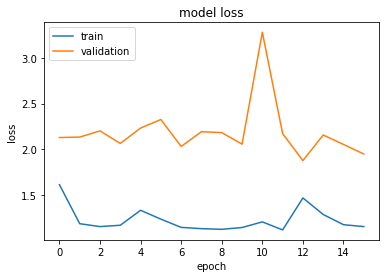

In [139]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H8.history['loss'])
plt.plot(H8.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Valores de loss altos en comparación a los anteriores modelos, lejos de la curva de entrenamiento e irregular.

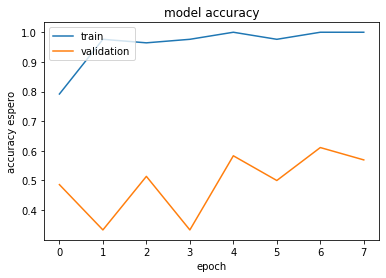

In [87]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H8.history['accuracy'])
plt.plot(H8.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')


Observamos overfitting, rápidamente llegó a 1 en la data de entrenamiento pero validación no supera el 0.60 y se alejan ambas muestras en sus resultados. Quizá con más épocas mejore resultados pero se necesitarían muchas de ellas.

# Ahora probaremos con una última red preentrenada, ResNet

In [140]:
from tensorflow.keras.applications import ResNet50 
# imports the MobileNet model and discards the last layer.
base_model = ResNet50(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu',kernel_regularizer=tf.keras.regularizers.L1(0.01),activity_regularizer=tf.keras.regularizers.L2(0.01))(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
preds = Dense(3, activation='softmax')(x) #3 tipos de osos

In [141]:
model9 = Model(inputs=base_model.input, outputs=preds)

In [142]:
len (base_model.layers)

175

In [143]:
len (model9.layers)-len (base_model.layers)-1

2

In [144]:
for layer in model9.layers[:175]:
    layer.trainable=False
for layer in model9.layers[175:]:
    layer.trainable=True
model9.summary()

Model: "functional_17"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_9[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
______________________________________________________________________________________

Hay mucho más capas y en consecuencia parámetros comparado a las 2 redes preentrenadas anteriores

In [145]:
from keras.applications.resnet50 import preprocess_input as preprocess_resnet50

train_datagen = ImageDataGenerator(preprocessing_function=preprocess_resnet50) 

color_mode='rgb'
batch_size=8
class_mode='categorical'
shuffle=True

train_generator=train_datagen.flow_from_directory(data_entrenamiento, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)


val_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16) 

val_generator=val_datagen.flow_from_directory(data_validacion, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)

print(train_generator.class_indices)
print(val_generator.class_indices)

Found 168 images belonging to 3 classes.
Found 72 images belonging to 3 classes.
{'black': 0, 'grizzly': 1, 'teddys': 2}
{'black': 0, 'grizzly': 1, 'teddys': 2}


In [146]:

model9.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H9=model9.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )


Epoch 1/16
84/84 [==============================] - 3s 41ms/step - loss: 77.8271 - accuracy: 0.9107 - val_loss: 8.7836 - val_accuracy: 0.9306
Epoch 2/16
84/84 [==============================] - 2s 30ms/step - loss: 4.4125 - accuracy: 0.9643 - val_loss: 3.4747 - val_accuracy: 0.7083
Epoch 3/16
84/84 [==============================] - 3s 30ms/step - loss: 2.9763 - accuracy: 0.9286 - val_loss: 2.9050 - val_accuracy: 0.8750
Epoch 4/16
84/84 [==============================] - 3s 30ms/step - loss: 2.4495 - accuracy: 0.9643 - val_loss: 3.1313 - val_accuracy: 0.9167
Epoch 5/16
84/84 [==============================] - 3s 30ms/step - loss: 2.6745 - accuracy: 0.9643 - val_loss: 2.3052 - val_accuracy: 0.9306
Epoch 6/16
84/84 [==============================] - 2s 30ms/step - loss: 2.3453 - accuracy: 0.9524 - val_loss: 2.0035 - val_accuracy: 0.9583
Epoch 7/16
84/84 [==============================] - 2s 30ms/step - loss: 2.5076 - accuracy: 0.9464 - val_loss: 2.3542 - val_accuracy: 0.9444
Epoch 8/16
8

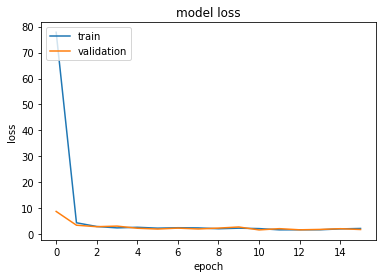

In [147]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H9.history['loss'])
plt.plot(H9.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Disminuye gradualmente, acompañada de la curva de entrenamiento, terminó en 1.8216.

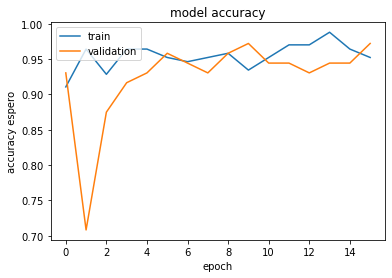

In [148]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H9.history['accuracy'])
plt.plot(H9.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')


Luego de un mínimo crece rápido y alcanza valores alrededor de 0.97, terminando en 0.9722. 

In [200]:
max_val_acc_h9 = max(H9.history['val_accuracy'])
mean_val_acc_h9 = np.mean(H9.history['val_accuracy'])
print(max_val_acc_h9)
print(mean_val_acc_h9)

0.9722222089767456
0.9253472164273262


Alcanzó un buen máximo y si bien el promedio no es mejor que el primer modelo, éste se debe a una época en que cayó pero luego fue consistentemente alto.

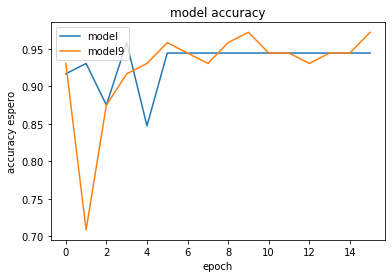

In [202]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H.history['val_accuracy'])
plt.plot(H9.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['model', 'model9'], loc='upper left')

Comparativamente el modelo de ResNet50 tiene valores por encima y debajo que el primer modelo VGG16 pero promete superarlo en las siguientes épocas.

black


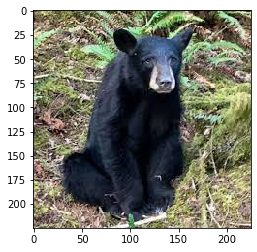

grizzly


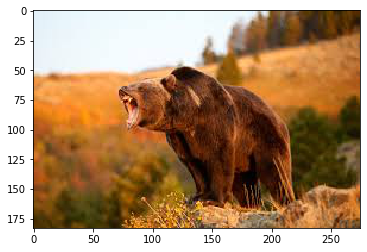

grizzly


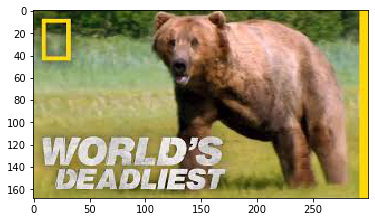

teddys


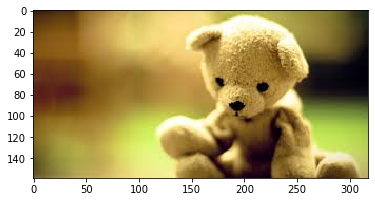

teddys


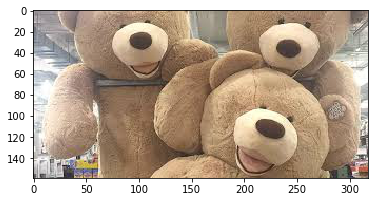

teddys


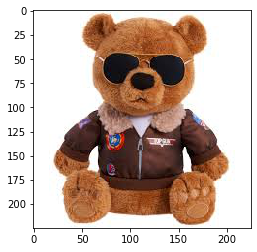

teddys


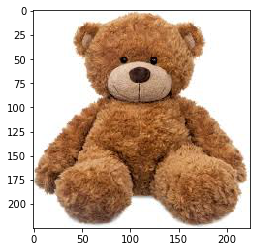

teddys


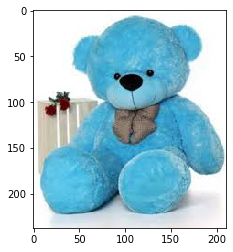

teddys


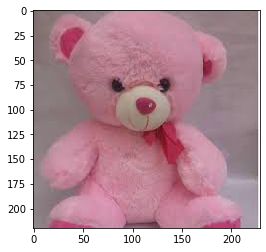

grizzly


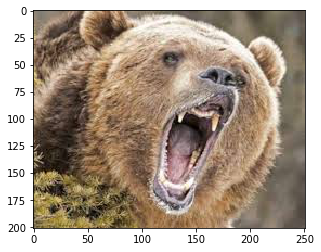

teddys


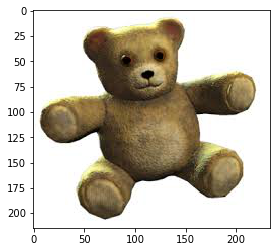

black


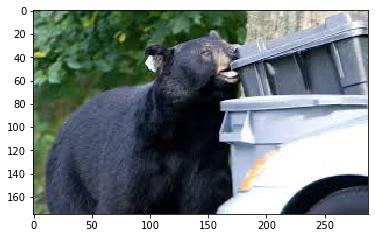

grizzly


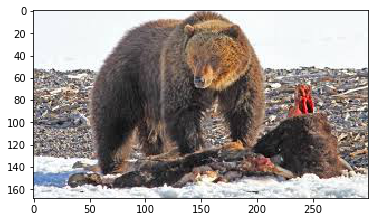

black


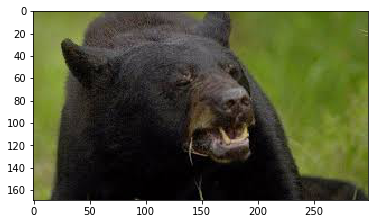

grizzly


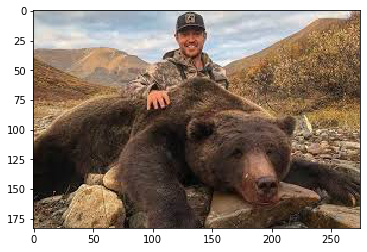

black


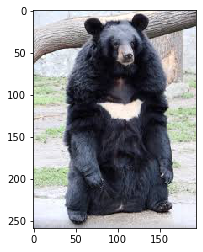

grizzly


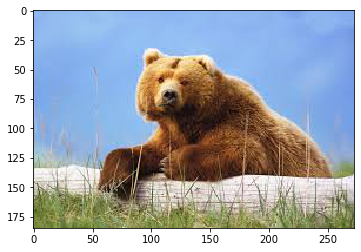

black


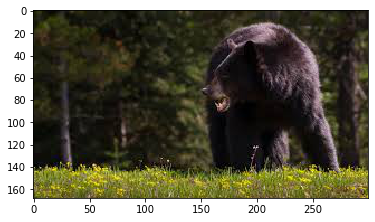

In [149]:

class_dict = {v:k for k, v in train_generator.class_indices.items()}

def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_resnet50(data)
    preds = model9.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')


path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

Acertó las 18 imágenes.

In [177]:
model9.save('C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/practicas/models/modelo9_resnet50_1.h5')

# A continuación vamos a modificar los parámetros de optimización sobre las redes y arquitecturas mencionadas

In [150]:

from numpy.random import seed
seed(123)
from tensorflow import random
random.set_seed(456)

In [151]:
from tensorflow.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow.keras.applications.vgg16 import VGG16
# imports the vgg16 model and discards the last layer.
base_model = VGG16(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
preds = Dense(3, activation='softmax')(x) #3 tipos de osos

In [152]:
model10 = Model(inputs=base_model.input, outputs=preds)

In [153]:
for layer in model.layers[:19]:
    layer.trainable=False
for layer in model.layers[19:]:
    layer.trainable=True
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)  

In [154]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16) 

color_mode='rgb'
batch_size=8
class_mode='categorical'
shuffle=True

train_generator=train_datagen.flow_from_directory(data_entrenamiento, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)


val_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16) 

val_generator=val_datagen.flow_from_directory(data_validacion, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)

print(train_generator.class_indices)
print(val_generator.class_indices)

Found 168 images belonging to 3 classes.
Found 72 images belonging to 3 classes.
{'black': 0, 'grizzly': 1, 'teddys': 2}
{'black': 0, 'grizzly': 1, 'teddys': 2}


Vamos a modificar la tasa de aprendizaje del algoritmo de optimización , reduciéndola haciendo que el entrenamiento sea más lento pero revisando no se esté cayendo en mínimos locales. Ya que será más lento le agregaremos más épocas.

In [160]:
from keras.optimizers import Adam

#Según lod documentos tensorflow por default la tasa de aprendizaje es 0.001 vamos a modificarla
model10.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-6),  loss='categorical_crossentropy', metrics=['accuracy'])


# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size


#Como la tasa de aprendizaje es menor, agregaremos más épocas
H10=model10.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=32,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/32
84/84 [==============================] - 9s 102ms/step - loss: 0.0113 - accuracy: 1.0000 - val_loss: 0.4165 - val_accuracy: 0.8194
Epoch 2/32
84/84 [==============================] - 8s 100ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.3984 - val_accuracy: 0.8194
Epoch 3/32
84/84 [==============================] - 8s 101ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.3869 - val_accuracy: 0.8333
Epoch 4/32
84/84 [==============================] - 8s 101ms/step - loss: 7.8369e-04 - accuracy: 1.0000 - val_loss: 0.3776 - val_accuracy: 0.8611
Epoch 5/32
84/84 [==============================] - 8s 100ms/step - loss: 5.6418e-04 - accuracy: 1.0000 - val_loss: 0.3752 - val_accuracy: 0.8611
Epoch 6/32
84/84 [==============================] - 8s 100ms/step - loss: 4.2471e-04 - accuracy: 1.0000 - val_loss: 0.3727 - val_accuracy: 0.8611
Epoch 7/32
84/84 [==============================] - 8s 100ms/step - loss: 3.2943e-04 - accuracy: 1.0000 - val_loss: 0.3709 - val_accurac

In [203]:
El accuracy va creciendo por tramos de iteraciones, vamos a agregar aún más.

SyntaxError: invalid syntax (<ipython-input-203-37972587a0f2>, line 1)

In [163]:
from keras.optimizers import Adam

#Según lod documentos tensorflow por default la tasa de aprendizaje es 0.001 vamos a modificarla
model10.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-6),  loss='categorical_crossentropy', metrics=['accuracy'])


# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size


#Vimos que el accuracy aumenta lentamente pero consistemente, vamos aumentar las épocas
H10=model10.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=64,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/64
84/84 [==============================] - 9s 103ms/step - loss: 1.4275e-05 - accuracy: 1.0000 - val_loss: 0.4171 - val_accuracy: 0.8889
Epoch 2/64
84/84 [==============================] - 8s 100ms/step - loss: 2.6680e-06 - accuracy: 1.0000 - val_loss: 0.4212 - val_accuracy: 0.8750
Epoch 3/64
84/84 [==============================] - 9s 102ms/step - loss: 1.0303e-06 - accuracy: 1.0000 - val_loss: 0.4291 - val_accuracy: 0.8750
Epoch 4/64
84/84 [==============================] - 8s 101ms/step - loss: 6.7126e-07 - accuracy: 1.0000 - val_loss: 0.4317 - val_accuracy: 0.8750
Epoch 5/64
84/84 [==============================] - 8s 101ms/step - loss: 4.8748e-07 - accuracy: 1.0000 - val_loss: 0.4356 - val_accuracy: 0.8750
Epoch 6/64
84/84 [==============================] - 8s 101ms/step - loss: 3.6189e-07 - accuracy: 1.0000 - val_loss: 0.4387 - val_accuracy: 0.8750
Epoch 7/64
84/84 [==============================] - 9s 101ms/step - loss: 2.8383e-07 - accuracy: 1.0000 - val_loss: 0.4416 -

Epoch 57/64
84/84 [==============================] - 9s 102ms/step - loss: 7.0958e-10 - accuracy: 1.0000 - val_loss: 0.4711 - val_accuracy: 0.8889
Epoch 58/64
84/84 [==============================] - 9s 101ms/step - loss: 7.0958e-10 - accuracy: 1.0000 - val_loss: 0.4709 - val_accuracy: 0.9028
Epoch 59/64
84/84 [==============================] - 9s 102ms/step - loss: 7.0958e-10 - accuracy: 1.0000 - val_loss: 0.4705 - val_accuracy: 0.9028
Epoch 60/64
84/84 [==============================] - 9s 102ms/step - loss: 7.0958e-10 - accuracy: 1.0000 - val_loss: 0.4697 - val_accuracy: 0.9028
Epoch 61/64
84/84 [==============================] - 9s 101ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.4685 - val_accuracy: 0.9028
Epoch 62/64
84/84 [==============================] - 9s 101ms/step - loss: 7.0958e-10 - accuracy: 1.0000 - val_loss: 0.4679 - val_accuracy: 0.9028
Epoch 63/64
84/84 [==============================] - 9s 101ms/step - loss: 2.1287e-09 - accuracy: 1.0000 - val_loss: 0

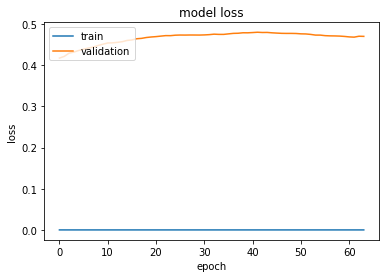

In [164]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H10.history['loss'])
plt.plot(H10.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Se obtuvo bajo loss llegando a ser 0.4698, la data de entrenamiento hizo overfitting rápidamente.

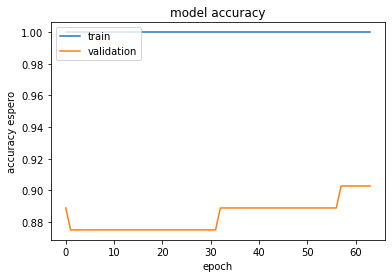

In [165]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H10.history['accuracy'])
plt.plot(H10.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Se requieren muchas épocas para poder dar saltos de incremento de accuracy , finalmente llegamos a 0.9028

Veamos si la tasa de aprendizaje no la reducimos tanto.

In [166]:
from keras.optimizers import Adam

#Según lod documentos tensorflow por default la tasa de aprendizaje es 0.001 vamos a modificarla
model10.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),  loss='categorical_crossentropy', metrics=['accuracy'])


# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size


#Luego de aumentar épocas vimos que aumentó también el accuracy pero ya no dió para más de 0.90. Vamos a aumentar la tasa de 
#aprendizaje para que sea más rápido el aprendizaje pero no tanto como iniciamos, con ello evitaremos algun mínimo local
#que pudiésemos haber caído en el primer modelo de todos
H10=model10.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=64,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/64
84/84 [==============================] - 9s 103ms/step - loss: 0.4734 - accuracy: 0.8929 - val_loss: 0.9959 - val_accuracy: 0.6389
Epoch 2/64
84/84 [==============================] - 8s 100ms/step - loss: 0.8933 - accuracy: 0.5655 - val_loss: 1.8435 - val_accuracy: 0.3333
Epoch 3/64
84/84 [==============================] - 8s 100ms/step - loss: 1.0361 - accuracy: 0.4286 - val_loss: 1.0314 - val_accuracy: 0.4583
Epoch 4/64
84/84 [==============================] - 8s 100ms/step - loss: 0.9474 - accuracy: 0.4821 - val_loss: 1.3276 - val_accuracy: 0.6389
Epoch 5/64
84/84 [==============================] - 8s 100ms/step - loss: 1.3940 - accuracy: 0.5119 - val_loss: 0.8263 - val_accuracy: 0.6389
Epoch 6/64
84/84 [==============================] - 8s 101ms/step - loss: 0.7226 - accuracy: 0.6131 - val_loss: 0.5519 - val_accuracy: 0.6806
Epoch 7/64
84/84 [==============================] - 8s 100ms/step - loss: 1.5489 - accuracy: 0.4940 - val_loss: 1.0968 - val_accuracy: 0.2917
Epoch 

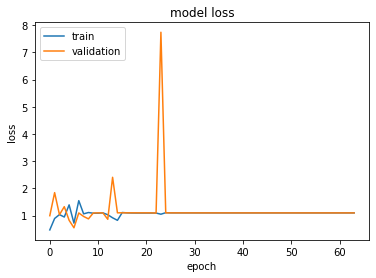

In [167]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H10.history['loss'])
plt.plot(H10.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

El loss se quedó 'pegado' en 1.0986

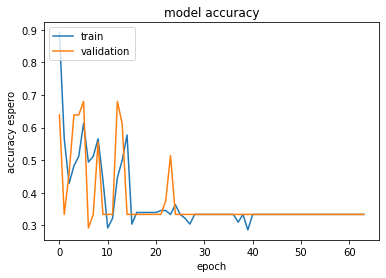

In [168]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H10.history['accuracy'])
plt.plot(H10.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

El accuracy se quedó en 0.33, en dicha tasa de aprendizaje quizá se haya caída en un mínimo local

# Ahora cambiemos el algoritmo de optimización

In [176]:
model11 = Model(inputs=base_model.input, outputs=preds)

from tensorflow.keras.optimizers import SGD
opt = SGD(lr=0.0001,   nesterov=True)
model11.compile(loss = "categorical_crossentropy", optimizer = opt, metrics=['accuracy'])

# Stochastic gradient descent optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size



H11=model11.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/16
84/84 [==============================] - 8s 100ms/step - loss: 1.0986 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch 2/16
84/84 [==============================] - 8s 97ms/step - loss: 1.0986 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch 3/16
84/84 [==============================] - 8s 97ms/step - loss: 1.0986 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch 4/16
84/84 [==============================] - 8s 98ms/step - loss: 1.0986 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch 5/16
84/84 [==============================] - 8s 98ms/step - loss: 1.0986 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch 6/16
84/84 [==============================] - 8s 99ms/step - loss: 1.0986 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch 7/16
84/84 [==============================] - 8s 98ms/step - loss: 1.0986 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch 8/16
8

No logra salir del 0.333 de accuracy a pesar de que redujimos la tasa de aprendizaje pro defecto del algoritmo SGD

# A continuación revisaremos la tasa de aprendizaje del optimizador Adam para la red ResNet50 que nos dió buen accuracy

In [178]:
from tensorflow.keras.applications import ResNet50 
# imports the MobileNet model and discards the last layer.
base_model = ResNet50(weights='imagenet', include_top=False) 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu',kernel_regularizer=tf.keras.regularizers.L1(0.01),activity_regularizer=tf.keras.regularizers.L2(0.01))(x) #capa densa con 512 unidades, se intentó con 1024 pero la memoria colapsó
preds = Dense(3, activation='softmax')(x) #3 tipos de osos


In [179]:
model12 = Model(inputs=base_model.input, outputs=preds)

In [180]:
for layer in model12.layers[:175]:
    layer.trainable=False
for layer in model12.layers[175:]:
    layer.trainable=True
model12.summary()


Model: "functional_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_11[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
______________________________________________________________________________________

In [182]:
from keras.applications.resnet50 import preprocess_input as preprocess_resnet50

train_datagen = ImageDataGenerator(preprocessing_function=preprocess_resnet50) 

color_mode='rgb'
batch_size=8
class_mode='categorical'
shuffle=True

train_generator=train_datagen.flow_from_directory(data_entrenamiento, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)


val_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16) 

val_generator=val_datagen.flow_from_directory(data_validacion, # this is where you specify the path to the main data folder
                                                    target_size=(224,224),
                                                    # default parameters
                                                    color_mode='rgb',
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    shuffle=True)

print(train_generator.class_indices)
print(val_generator.class_indices)

Found 168 images belonging to 3 classes.
Found 72 images belonging to 3 classes.
{'black': 0, 'grizzly': 1, 'teddys': 2}
{'black': 0, 'grizzly': 1, 'teddys': 2}


In [184]:

model12.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),  loss='categorical_crossentropy', metrics=['accuracy'])

# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

step_size_train=train_generator.n//train_generator.batch_size
step_size_val=val_generator.n//val_generator.batch_size

H12=model12.fit_generator(generator=train_generator,
                      steps_per_epoch=step_size_train,
                      epochs=16,
                      validation_data=val_generator,
                      validation_steps=step_size_val
                     )

Epoch 1/16
84/84 [==============================] - 3s 41ms/step - loss: 0.5745 - accuracy: 1.0000 - val_loss: 0.4749 - val_accuracy: 0.9444
Epoch 2/16
84/84 [==============================] - 2s 30ms/step - loss: 0.3726 - accuracy: 1.0000 - val_loss: 0.4161 - val_accuracy: 0.9583
Epoch 3/16
84/84 [==============================] - 2s 30ms/step - loss: 0.3634 - accuracy: 1.0000 - val_loss: 0.4301 - val_accuracy: 0.9583
Epoch 4/16
84/84 [==============================] - 2s 30ms/step - loss: 0.3592 - accuracy: 1.0000 - val_loss: 0.4154 - val_accuracy: 0.9583
Epoch 5/16
84/84 [==============================] - 2s 29ms/step - loss: 0.3552 - accuracy: 1.0000 - val_loss: 0.4171 - val_accuracy: 0.9444
Epoch 6/16
84/84 [==============================] - 2s 30ms/step - loss: 0.3698 - accuracy: 0.9940 - val_loss: 0.4126 - val_accuracy: 0.9444
Epoch 7/16
84/84 [==============================] - 2s 30ms/step - loss: 0.3472 - accuracy: 0.9940 - val_loss: 0.4739 - val_accuracy: 0.9583
Epoch 8/16
84

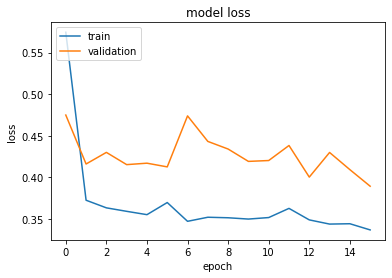

In [185]:

import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H12.history['loss'])
plt.plot(H12.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

A pesar que oscila el loss , en general va disminuyendo y llegó a 0.3894.

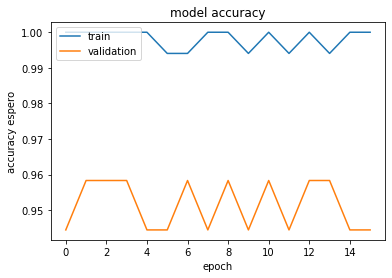

In [186]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(H12.history['accuracy'])
plt.plot(H12.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy espero')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

Éste obtiene valores cercanos al 0.96 en alguna épocas, terminando en 0.9444. Quizá necesite más épocas.

In [201]:
max_val_acc_h12 = max(H12.history['val_accuracy'])
mean_val_acc_h12 = np.mean(H12.history['val_accuracy'])
print(max_val_acc_h12)
print(mean_val_acc_h12)

0.9583333134651184
0.9513888657093048


El valor máximo se encuentra cercano al promedio pero en la gráfica vemos que el accuracy no es tan estable aunque oscila en un rango muy pequeño. Si vemos el promedio podríamos decir que supera al primer modelo y al 9no. 

black


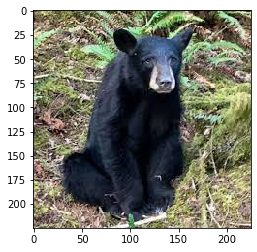

grizzly


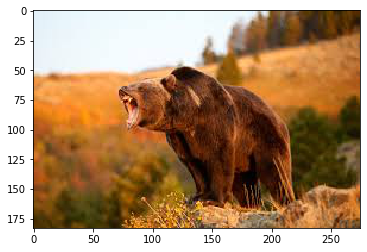

grizzly


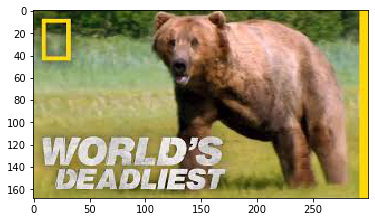

teddys


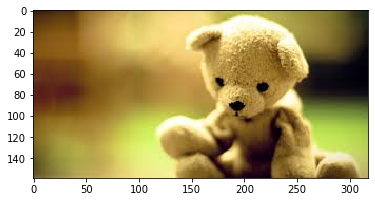

teddys


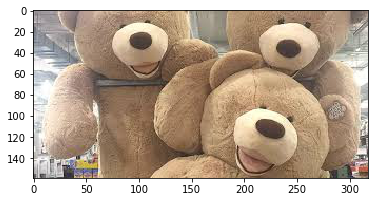

teddys


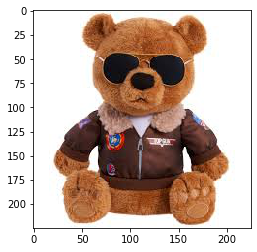

teddys


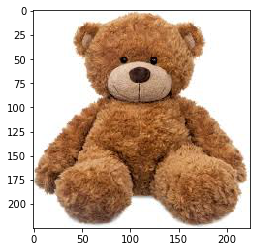

teddys


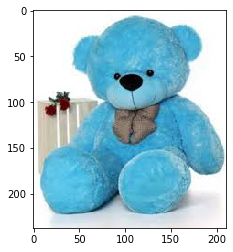

teddys


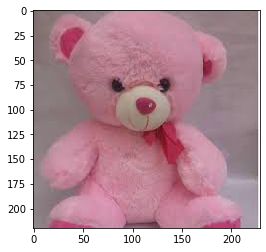

grizzly


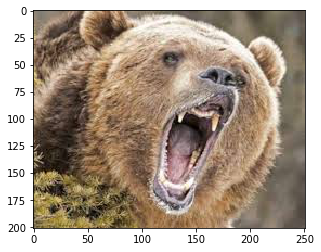

teddys


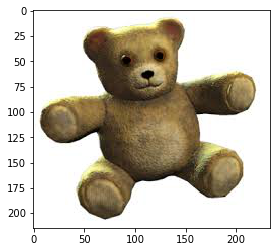

black


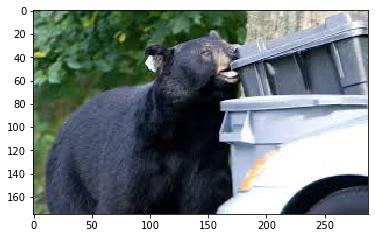

grizzly


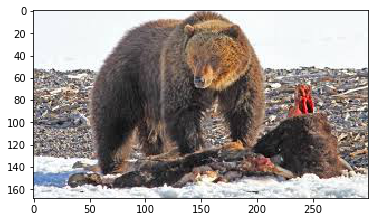

black


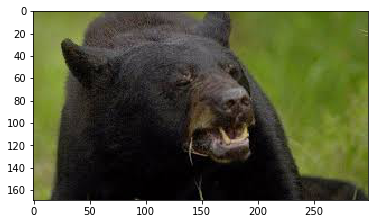

grizzly


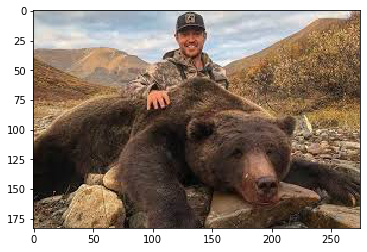

black


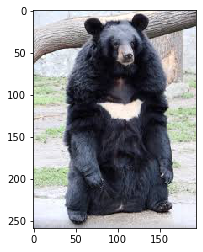

grizzly


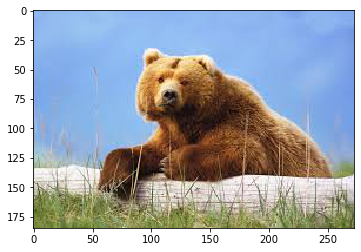

black


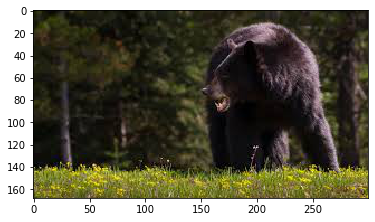

In [187]:

class_dict = {v:k for k, v in train_generator.class_indices.items()}

def predict_image(path):
    img = image.load_img(path)
    # in order to ease the computations
    img = img.resize((224, 224))
    data = expand_dims(image.img_to_array(img), 0)
    data = preprocess_resnet50(data)
    preds = model12.predict(data)
    pred = np.argmax(preds)
    pred = class_dict[pred]
    print(pred)
    return img
#pred_path = 'C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/'
#predict_image(pred_path + '/chorra_tests/gato.jpg')


path  = base_path + '/output/test_internet'
for (dirpath, dirnames, filenames) in os.walk(path):
    for filename in filenames:
        if filename.endswith('.jpg'): 
            new_path = os.sep.join([dirpath, filename])
            predict_image(new_path)
            i=image.load_img(new_path)
            plt.imshow(i)
            plt.show()

Acertó los 18 también.

In [188]:
model12.save('C:/Users/andre/anaconda3/envs/master/online_deep_learning_intro-master/datasets/practicas/models/modelo12_resnet50_2.h5')

<span style='color:blue'> Finalmente nos quedamos con el modelo entrenado sobre Resnet50 con una capa adicional de 512 neuronas , utilizando el optimizador Adam con la tasa de aprendizaje por defecto -modelo9_resnet50_1.h5- ya que éste obtuvo el valor máximo de accuracy, si bien el promedio fue de 0.9253472164273262 menor que el modelo 12, en las última épocas se estabilizó en valores cercanos al máximo (0.9722222089767456). 
Haría falta una muestra de imágenes para testing y quizá más épocas para concluir con mayor seguridad pero el 0.97 ya es buen valor de accuracy. </span>